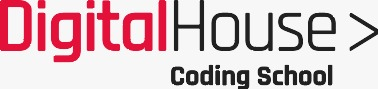

##  Final Challenge,  Data Science Course, 2020 - 2021

### 1. Data presentation

In [1]:
import numpy as np
import pandas as pd 
# Data read
df = pd.read_csv('C:/Users/maria/Desktop/CPTAC-3/data_miRNA.csv')
df.head()

,Unnamed: 0,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b,gender,age_at_diagnosis,primary_diagnosis,tumor_grade,tumor_stage
0,0,15.236065,15.186093,15.188128,13.714389,14.074671,11.884881,11.226529,14.497747,14.592864,...,0.0,1.966870,11.581120,14.111949,11.893907,female,22613.0,Glioblastoma,Not Reported,NOT REPORTED
1,1,14.382911,14.351445,14.357197,13.171616,13.566840,10.736305,10.926948,13.755154,13.840824,...,0.0,7.699032,11.088575,13.857902,12.008081,female,26097.0,Glioblastoma,Not Reported,NOT REPORTED
2,2,13.768529,13.698553,13.715105,11.769493,10.766500,12.179938,10.345813,14.455957,14.589400,...,0.0,8.267236,12.781438,10.912778,11.535000,female,27702.0,"Endometrioid adenocarcinoma, NOS",G3,I
3,3,14.756170,14.715036,14.715615,13.243572,11.120588,11.935819,10.090452,14.470656,14.542343,...,0.0,6.245282,10.274397,11.881488,11.635385,male,24361.0,"Adenocarcinoma, NOS",G2,I
4,4,14.382875,14.348864,14.350482,13.077982,13.350279,11.371183,11.113830,14.226042,14.316096,...,0.0,7.550508,11.627686,13.983238,12.271183,male,22025.0,Glioblastoma,Not Reported,NOT REPORTED


In [2]:
df = df.drop(columns = 'Unnamed: 0')

In [3]:
#Columns with high proportion of 'Not reported' were dropped
df= df.drop(columns = ['tumor_grade', 'tumor_stage'])

In [4]:
df.primary_diagnosis.value_counts(normalize = True).round(2)

Squamous cell carcinoma, NOS        0.25
Renal cell carcinoma, NOS           0.23
Infiltrating duct carcinoma, NOS    0.16
Adenocarcinoma, NOS                 0.12
Glioblastoma                        0.12
Endometrioid adenocarcinoma, NOS    0.12
Name: primary_diagnosis, dtype: float64

In [5]:
import seaborn as sns
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

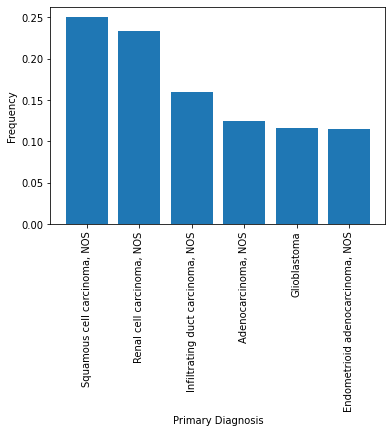

In [6]:
# plot 'primary-diagnosis' distribution
plt.bar(df.primary_diagnosis.value_counts(normalize = True).index, df.primary_diagnosis.value_counts(normalize = True).values)
plt.xticks(df.primary_diagnosis.value_counts(normalize = True).index, rotation = 90)
plt.xlabel('Primary Diagnosis')
plt.ylabel('Frequency')
plt.show()


In [7]:
# Nulls 
df.isnull().sum()

hsa-let-7a-1         0
hsa-let-7a-2         0
hsa-let-7a-3         0
hsa-let-7b           0
hsa-let-7c           0
                    ..
hsa-mir-99a          0
hsa-mir-99b          0
gender               0
age_at_diagnosis     0
primary_diagnosis    0
Length: 1679, dtype: int64

### 2- Data pre-processing for modeling

In [8]:
# Identification of features and target variables
df_x = df.drop(columns = ['primary_diagnosis'])
df_x.shape

(843, 1678)

In [9]:
#Numeric columns of features
numeric_columns2 = [col for col in df.columns if df[col].dtypes == 'float']
df_2= df_x[numeric_columns2]
df_2.dtypes

hsa-let-7a-1        float64
hsa-let-7a-2        float64
hsa-let-7a-3        float64
hsa-let-7b          float64
hsa-let-7c          float64
                     ...   
hsa-mir-96          float64
hsa-mir-98          float64
hsa-mir-99a         float64
hsa-mir-99b         float64
age_at_diagnosis    float64
Length: 1677, dtype: object

In [10]:
df_2.shape

(843, 1677)

In [11]:
#Feature Selection #1, por variancia
from sklearn.feature_selection import VarianceThreshold

# Instanciamos la clase VarianceThreshold definiendo un threshold=0.5

fet_sel = VarianceThreshold(threshold=0.5)

# Fiteamos a fet_sel con nuestro df1:

fet_sel.fit_transform(df_2)


array([[1.37143888e+01, 1.40746710e+01, 1.12265293e+01, ...,
        1.41119493e+01, 1.18939073e+01, 2.26130000e+04],
       [1.31716156e+01, 1.35668396e+01, 1.09269484e+01, ...,
        1.38579019e+01, 1.20080806e+01, 2.60970000e+04],
       [1.17694930e+01, 1.07664997e+01, 1.03458133e+01, ...,
        1.09127782e+01, 1.15350004e+01, 2.77020000e+04],
       ...,
       [1.20953618e+01, 1.37460013e+01, 1.05846842e+01, ...,
        1.42133747e+01, 1.19798516e+01, 1.40280000e+04],
       [1.19425548e+01, 1.04242665e+01, 1.07315632e+01, ...,
        1.11472149e+01, 1.17107460e+01, 1.37310000e+04],
       [1.23568303e+01, 1.12449571e+01, 1.04043725e+01, ...,
        1.15424583e+01, 1.12288809e+01, 1.77600000e+04]])

In [12]:
#Columns shape decreased to 1204
df_2.columns[fet_sel.get_support()]

Index(['hsa-let-7b', 'hsa-let-7c', 'hsa-let-7e', 'hsa-mir-1-1', 'hsa-mir-1-2',
       'hsa-mir-100', 'hsa-mir-101-1', 'hsa-mir-101-2', 'hsa-mir-105-1',
       'hsa-mir-105-2',
       ...
       'hsa-mir-939', 'hsa-mir-940', 'hsa-mir-942', 'hsa-mir-943',
       'hsa-mir-944', 'hsa-mir-95', 'hsa-mir-96', 'hsa-mir-99a', 'hsa-mir-99b',
       'age_at_diagnosis'],
      dtype='object', length=1203)

In [13]:
from sklearn.preprocessing import MinMaxScaler

In [14]:
# a data frame was created from the VarianceThreshold output
df_3 = pd.DataFrame(fet_sel.transform(df_2), columns = df_2.columns[fet_sel.get_support()])

#In order to avoid negative values, df_3 was normalized
df_3_normalized = (df_3 - df_3.min()) / ( df_3.max() - df_3.min())

In [15]:
df_3_normalized= df_3_normalized.reset_index()

In [16]:
df_3_normalized.shape

(843, 1204)

In [17]:
# 'object' type columns
categorical_columns= [col for col in df.columns if df[col].dtypes == 'object']
categorical_columns

['gender', 'primary_diagnosis']

In [18]:
df_4 = pd.DataFrame( df[categorical_columns], columns = df[categorical_columns].columns)
df_4= df_4.reset_index().drop(columns =['primary_diagnosis', 'index'])
df_4.shape

(843, 1)

In [19]:
df_4

,gender
0,female
1,female
2,female
3,male
4,male
...,...
838,female
839,female
840,female
841,female


In [20]:
from sklearn.preprocessing import OneHotEncoder

In [21]:
# OneHotEncoder (OHE) was used to encode categorical features as a one-hot numeric array.
encoder = OneHotEncoder(drop = 'first', sparse = False)
encoder.fit_transform(df_4)

array([[0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],

In [22]:
#A data frame was created  with the numeric array resultant from OHE
df_5= pd.DataFrame(encoder.fit_transform(df_4), columns = encoder.get_feature_names())
df_5.head()

,x0_male
0,0.0
1,0.0
2,0.0
3,1.0
4,1.0


In [23]:
#A new data frame was created as a result of a concatenation from df_3_normalized and df_5

df_6 = pd.concat([df_3_normalized,df_5], axis = 1)
df_6 = df_6.drop(columns = 'index')
df_6.shape

(843, 1204)

In [24]:
df_6.head()

,hsa-let-7b,hsa-let-7c,hsa-let-7e,hsa-mir-1-1,hsa-mir-1-2,hsa-mir-100,hsa-mir-101-1,hsa-mir-101-2,hsa-mir-105-1,hsa-mir-105-2,...,hsa-mir-940,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-96,hsa-mir-99a,hsa-mir-99b,age_at_diagnosis,x0_male
0,0.507918,0.907858,0.605467,0.380458,0.322030,0.809664,0.562729,0.551054,0.723331,0.700120,...,0.690019,0.479575,0.284855,0.268172,0.549268,0.153893,0.896962,0.568901,0.578183,0.0
1,0.407924,0.845345,0.559689,0.261184,0.195618,0.763569,0.543378,0.538877,0.578899,0.527789,...,0.527593,0.244846,0.218457,0.193437,0.402940,0.689853,0.873922,0.588848,0.721434,0.0
2,0.149615,0.500628,0.470886,0.296104,0.220136,0.264202,0.665612,0.668118,0.890531,0.884853,...,0.600347,0.576225,0.910903,0.354828,0.036469,0.742981,0.606828,0.506198,0.787427,0.0
3,0.421180,0.544215,0.431865,0.574821,0.533129,0.604725,0.670958,0.661217,0.353796,0.330954,...,0.271975,0.513742,0.910903,0.349486,0.553347,0.553927,0.694681,0.523736,0.650056,1.0
4,0.390674,0.818687,0.588246,0.392071,0.332965,0.791032,0.565673,0.557265,0.614937,0.576898,...,0.653901,0.560073,0.910903,0.393160,0.493995,0.675966,0.885289,0.634814,0.554007,1.0


In [25]:
# target column was codified with LabelEncoder
from sklearn.preprocessing import LabelEncoder

enc = LabelEncoder()
df['primary_diagnosis'] = enc.fit_transform(df['primary_diagnosis'])

In [26]:
df['primary_diagnosis'].value_counts()

5    211
4    197
3    135
0    105
2     98
1     97
Name: primary_diagnosis, dtype: int64

In [27]:
from sklearn.model_selection import train_test_split,  GridSearchCV
from sklearn.naive_bayes import GaussianNB

# resultant features and target
X= df_6
y=df['primary_diagnosis']

# Train test split: 
X_train, X_test, y_train, y_test=train_test_split(X,y, stratify=y, random_state = 12)
display(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(632, 1204)

(211, 1204)

(632,)

(211,)

In [30]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [31]:
#Features standarization
scaler = MinMaxScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.fit_transform(X_test)

In [32]:
#Feature Selection # 2 = SelectPercentile
from sklearn.feature_selection import SelectPercentile
fs_m = SelectPercentile(score_func=chi2, percentile=23.5)
fs_m.fit(X_train_sc, y_train)
X_train_reduced = fs_m.transform(X_train_sc)
X_test_reduced = fs_m.transform(X_test_sc)

In [33]:
#Data frame with results
feat_scores_m = pd.DataFrame()
feat_scores_m["F Score"] = fs_m.scores_
feat_scores_m["P Value"] = fs_m.pvalues_
feat_scores_m["Attribute"] = X_train.columns
feat_scores_m["Support"] = fs_m.get_support()
feat_scores_m.sort_values(["F Score"], ascending=False)

,F Score,P Value,Attribute,Support
1182,94.540619,7.459657e-19,hsa-mir-9-1,True
1197,84.240732,1.086005e-16,hsa-mir-944,True
1184,82.762106,2.216401e-16,hsa-mir-9-3,True
1183,82.402355,2.636315e-16,hsa-mir-9-2,True
20,77.304672,3.071662e-15,hsa-mir-122,True
...,...,...,...,...
735,0.078516,9.999107e-01,hsa-mir-5089,False
1026,0.071694,9.999286e-01,hsa-mir-6790,False
974,0.059049,9.999559e-01,hsa-mir-6740,False
609,0.049693,9.999712e-01,hsa-mir-4706,False


In [34]:
# Data frame with resultant features from feature selection (train set)
X_train_reduced_data = pd.DataFrame(X_train.loc[:,fs_m.get_support()], columns= (X_train.loc[:,fs_m.get_support()]).columns)

In [35]:
#data frame was reduced to 285 features
X_train_reduced_data.shape

(632, 283)

In [36]:
# Data frame with resultant features from feature selection (test set)
X_test_reduced_data = pd.DataFrame(X_test.loc[:,fs_m.get_support()], columns= (X_test.loc[:,fs_m.get_support()]).columns)

### 3-  Model Building and Tunning

### Model 1. NAIVE_BAYES

In [37]:
#Model 1. NAIVE_BAYES

NB = GaussianNB()
NB.fit(X_train_reduced, y_train)


GaussianNB()

In [38]:
#prediction calculations for train and test sets
y_predict_test = NB.predict(X_test_reduced)
y_predict_train= NB.predict(X_train_reduced)

In [39]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix


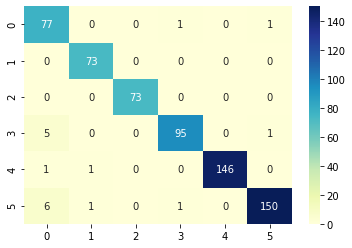

In [40]:
#visualization of confussion matrix for train set
conf_matrix = confusion_matrix(y_train, y_predict_train)
conf_mat_df = pd.DataFrame(data=conf_matrix)

sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='YlGnBu');


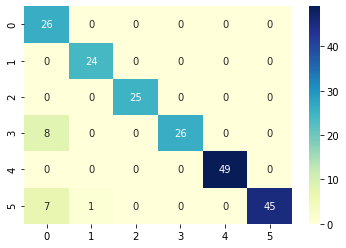

In [41]:
#visualization of confussion matrix for test set
conf_matrix = confusion_matrix(y_test, y_predict_test)
conf_mat_df = pd.DataFrame(data=conf_matrix)

sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='YlGnBu');


In [42]:
#Accuracy for test set
accuracy_score(y_predict_test, y_test)

0.9241706161137441

In [43]:
from sklearn.metrics import classification_report

#Classification report for train set
print(classification_report(y_train, y_predict_train))

              precision    recall  f1-score   support

           0       0.87      0.97      0.92        79
           1       0.97      1.00      0.99        73
           2       1.00      1.00      1.00        73
           3       0.98      0.94      0.96       101
           4       1.00      0.99      0.99       148
           5       0.99      0.95      0.97       158

    accuracy                           0.97       632
   macro avg       0.97      0.98      0.97       632
weighted avg       0.97      0.97      0.97       632



In [44]:
#Classification report for test set
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           0       0.63      1.00      0.78        26
           1       0.96      1.00      0.98        24
           2       1.00      1.00      1.00        25
           3       1.00      0.76      0.87        34
           4       1.00      1.00      1.00        49
           5       1.00      0.85      0.92        53

    accuracy                           0.92       211
   macro avg       0.93      0.94      0.92       211
weighted avg       0.95      0.92      0.93       211



### Model 2. LOGISTIC REGRESSION

In [45]:
from sklearn.linear_model import LogisticRegression

In [46]:
# Cross validation for logistic regression to find the best hyper parameters

from sklearn.model_selection import StratifiedKFold
skf=StratifiedKFold(n_splits=5,shuffle=True,random_state=0)

params_m = [
    {'C': [0.1, 1, 10],
     'penalty': ['l1','l2']}]

In [47]:
# Cross validation was made by grid search
gs = GridSearchCV(estimator= LogisticRegression(multi_class= 'multinomial', max_iter = 5000, solver = 'lbfgs'),\
                  param_grid=params_m, scoring='accuracy', cv=skf, n_jobs=4)

fit = gs.fit(X_train_reduced, y_train)
 

In [48]:
# Grid search best score
gs.best_score_

0.9857392825896764

In [49]:
# Grid search best parameters
gs.best_params_

{'C': 1, 'penalty': 'l2'}

In [50]:
#prediction calculations for train and test sets
y_predict_log_train = gs.predict(X_train_reduced)
y_predict_log_test = gs.predict(X_test_reduced)


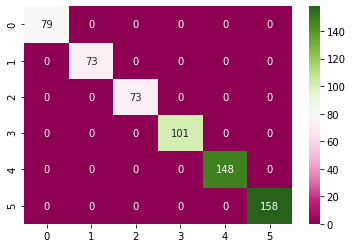

In [51]:
#visualization of confussion matrix for train set
conf_matrix = conf_matrix = confusion_matrix(y_train, y_predict_log_train)
conf_mat_df = pd.DataFrame(data=conf_matrix)

sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='PiYG');

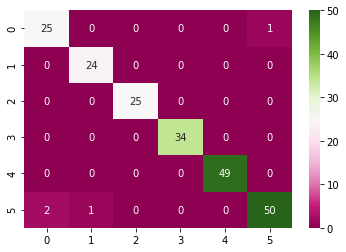

In [52]:
#visualization of confussion matrix for test set
conf_matrix = conf_matrix = confusion_matrix(y_test, y_predict_log_test)
conf_mat_df = pd.DataFrame(data=conf_matrix)

sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='PiYG');

In [53]:
#Classification report for train set

print(classification_report(y_train, y_predict_log_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        79
           1       1.00      1.00      1.00        73
           2       1.00      1.00      1.00        73
           3       1.00      1.00      1.00       101
           4       1.00      1.00      1.00       148
           5       1.00      1.00      1.00       158

    accuracy                           1.00       632
   macro avg       1.00      1.00      1.00       632
weighted avg       1.00      1.00      1.00       632



In [54]:
#Classification report for test set

print(classification_report(y_test, y_predict_log_test))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94        26
           1       0.96      1.00      0.98        24
           2       1.00      1.00      1.00        25
           3       1.00      1.00      1.00        34
           4       1.00      1.00      1.00        49
           5       0.98      0.94      0.96        53

    accuracy                           0.98       211
   macro avg       0.98      0.98      0.98       211
weighted avg       0.98      0.98      0.98       211



In [55]:
#Feature selection #3 gridsearch para RFE
from sklearn.feature_selection import RFECV

model = gs.best_estimator_

selector = RFECV(model, scoring='accuracy',step = 1, cv=skf, verbose=0,n_jobs=3)
selector.fit(X_train_reduced, y_train)

RFECV(cv=StratifiedKFold(n_splits=5, random_state=0, shuffle=True),
      estimator=LogisticRegression(C=1, max_iter=5000,
                                   multi_class='multinomial'),
      n_jobs=3, scoring='accuracy')

In [56]:
# 85 features were selected
selector.n_features_

85

In [57]:
# Data frame with resultant features

X_train_reduced_2= X_train_reduced_data.loc[:, selector.support_]
X_test_reduced_2 = X_test_reduced_data.loc[:, selector.support_]

In [58]:
#feature_names

X_train_reduced_2.columns

Index(['hsa-let-7b', 'hsa-mir-105-2', 'hsa-mir-10b', 'hsa-mir-122',
       'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-126', 'hsa-mir-1269a',
       'hsa-mir-1271', 'hsa-mir-128-2', 'hsa-mir-129-2', 'hsa-mir-133b',
       'hsa-mir-135a-1', 'hsa-mir-135b', 'hsa-mir-138-1', 'hsa-mir-141',
       'hsa-mir-142', 'hsa-mir-148a', 'hsa-mir-148b', 'hsa-mir-149',
       'hsa-mir-150', 'hsa-mir-152', 'hsa-mir-181a-1', 'hsa-mir-181b-1',
       'hsa-mir-187', 'hsa-mir-192', 'hsa-mir-194-1', 'hsa-mir-194-2',
       'hsa-mir-196b', 'hsa-mir-19b-2', 'hsa-mir-200b', 'hsa-mir-200c',
       'hsa-mir-203a', 'hsa-mir-203b', 'hsa-mir-204', 'hsa-mir-205',
       'hsa-mir-2110', 'hsa-mir-214', 'hsa-mir-215', 'hsa-mir-216a',
       'hsa-mir-216b', 'hsa-mir-217', 'hsa-mir-219a-2', 'hsa-mir-224',
       'hsa-mir-3065', 'hsa-mir-30a', 'hsa-mir-30b', 'hsa-mir-30c-1',
       'hsa-mir-30c-2', 'hsa-mir-30d', 'hsa-mir-31', 'hsa-mir-3128',
       'hsa-mir-326', 'hsa-mir-33a', 'hsa-mir-34b', 'hsa-mir-34c',
       'hsa-mi

### Model 3. LOGISTIC  REGRESSION AFTER RFE

In [59]:
model_reduced = gs.fit(X_train_reduced_2, y_train)

In [60]:
#prediction calculations for train and test sets

y_predict_log_train_reduced = model_reduced.predict(X_train_reduced_2)
y_predict_log_test_reduced = model_reduced.predict(X_test_reduced_2)

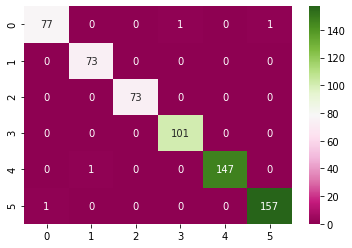

In [61]:
#visualization of confussion matrix for train set
conf_matrix = conf_matrix = confusion_matrix(y_train, y_predict_log_train_reduced)
conf_mat_df = pd.DataFrame(data=conf_matrix)                           
sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='PiYG');

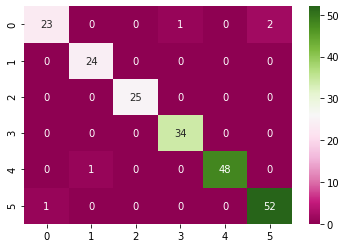

In [62]:
#visualization of confussion matrix for test set
conf_matrix = conf_matrix = confusion_matrix(y_test, y_predict_log_test_reduced)
conf_mat_df = pd.DataFrame(data=conf_matrix)                      

sns.heatmap(conf_mat_df, annot=True, fmt='d', cmap='PiYG');

In [63]:
#Classification report for train set

print(classification_report(y_train, y_predict_log_train_reduced))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98        79
           1       0.99      1.00      0.99        73
           2       1.00      1.00      1.00        73
           3       0.99      1.00      1.00       101
           4       1.00      0.99      1.00       148
           5       0.99      0.99      0.99       158

    accuracy                           0.99       632
   macro avg       0.99      0.99      0.99       632
weighted avg       0.99      0.99      0.99       632



In [64]:
#Classification report for test set

print(classification_report(y_test, y_predict_log_test_reduced))

              precision    recall  f1-score   support

           0       0.96      0.88      0.92        26
           1       0.96      1.00      0.98        24
           2       1.00      1.00      1.00        25
           3       0.97      1.00      0.99        34
           4       1.00      0.98      0.99        49
           5       0.96      0.98      0.97        53

    accuracy                           0.98       211
   macro avg       0.98      0.97      0.97       211
weighted avg       0.98      0.98      0.98       211



In [65]:
names_of_variables =np.array(X_train_reduced_2.columns)
names_of_variables

array(['hsa-let-7b', 'hsa-mir-105-2', 'hsa-mir-10b', 'hsa-mir-122',
       'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-126', 'hsa-mir-1269a',
       'hsa-mir-1271', 'hsa-mir-128-2', 'hsa-mir-129-2', 'hsa-mir-133b',
       'hsa-mir-135a-1', 'hsa-mir-135b', 'hsa-mir-138-1', 'hsa-mir-141',
       'hsa-mir-142', 'hsa-mir-148a', 'hsa-mir-148b', 'hsa-mir-149',
       'hsa-mir-150', 'hsa-mir-152', 'hsa-mir-181a-1', 'hsa-mir-181b-1',
       'hsa-mir-187', 'hsa-mir-192', 'hsa-mir-194-1', 'hsa-mir-194-2',
       'hsa-mir-196b', 'hsa-mir-19b-2', 'hsa-mir-200b', 'hsa-mir-200c',
       'hsa-mir-203a', 'hsa-mir-203b', 'hsa-mir-204', 'hsa-mir-205',
       'hsa-mir-2110', 'hsa-mir-214', 'hsa-mir-215', 'hsa-mir-216a',
       'hsa-mir-216b', 'hsa-mir-217', 'hsa-mir-219a-2', 'hsa-mir-224',
       'hsa-mir-3065', 'hsa-mir-30a', 'hsa-mir-30b', 'hsa-mir-30c-1',
       'hsa-mir-30c-2', 'hsa-mir-30d', 'hsa-mir-31', 'hsa-mir-3128',
       'hsa-mir-326', 'hsa-mir-33a', 'hsa-mir-34b', 'hsa-mir-34c',
       'hsa-mi

In [66]:
model_reduced.best_estimator_.coef_

array([[-2.71645996e-01,  2.65655350e-02, -5.15513325e-01,
        -1.55608060e-01, -1.98546748e-01, -1.41951609e-01,
         1.98133537e-01, -2.88370354e-02, -2.70453199e-01,
        -2.29622965e-01, -3.03722498e-01, -1.34461710e-01,
        -9.12629925e-02,  2.38378662e-01,  7.03539339e-02,
         3.06512680e-01,  6.09910448e-02,  2.26805904e-01,
         2.38299189e-01, -3.56574856e-01,  4.15391272e-02,
         3.22399435e-02,  2.53214954e-01,  3.00546476e-01,
         1.68627710e-01, -2.48573820e-01, -1.77930742e-01,
        -1.85024758e-01, -6.44294787e-01,  4.25425832e-02,
         5.03323713e-02,  2.87020335e-01, -3.27082226e-02,
         1.37916006e-01, -2.98402978e-01, -1.78238687e-01,
         1.79701590e-01, -3.09040381e-02, -7.17091304e-02,
        -1.94354535e-01, -9.72454919e-02, -1.28332691e-01,
        -1.13048954e-01,  1.98172686e-02,  3.94618688e-01,
        -2.29104290e-01,  3.41218778e-01, -3.70161004e-02,
        -4.40149470e-02,  4.48941297e-01, -3.79980464e-0

In [67]:
# 25 heaviest features were determined
#create random weights and get the magnitude
feature_importance = abs(model_reduced.best_estimator_.coef_[0])
feature_importance = 100.0 * (feature_importance / feature_importance.max())
#get the sorting indices
sorted_index = np.argsort(feature_importance)[::-1]

#check if the sorting indices are correct
print(feature_importance[sorted_index])

#get the index of the top-25 features
top_25 = sorted_index[:25]

#get the names of the top 25 most important features
list(names_of_variables[top_25])

[100.          92.63408996  74.11841395  71.38041155  64.54695784
  60.21706544  56.73667358  54.63204908  53.34925955  51.26688585
  50.95687572  49.05905118  44.06914928  43.6679882   43.27038124
  43.21135271  43.09370182  42.9031693   41.26661906  39.96713722
  39.05615895  38.88466351  36.40621849  35.73893508  35.16646362
  34.53487008  34.27311663  34.2616903   33.0142581   32.93968513
  32.60923254  30.21926855  28.79142233  28.54624578  28.48683595
  28.2908705   27.94350631  27.81783108  27.44392119  26.60210881
  25.83676534  25.62643508  25.58216007  25.35669604  24.24460785
  23.21786331  22.76577372  22.37269539  22.20842501  21.87109598
  20.40922635  19.82900369  19.33235904  18.45115359  18.39178746
  17.99785313  17.99319483  16.25371985  15.63712897  14.11017746
  13.9815622   13.12142271  12.37544644  11.81734083  10.91048972
  10.31004777  10.22875602  10.11520312   8.76904492   8.24013291
   7.2365841    6.32829047   6.11659997   5.97232714   5.93913581
   5.32202

['hsa-mir-3617',
 'hsa-mir-196b',
 'hsa-mir-10b',
 'hsa-mir-326',
 'hsa-mir-30d',
 'hsa-mir-375',
 'hsa-mir-3065',
 'hsa-mir-31',
 'hsa-mir-944',
 'hsa-mir-149',
 'hsa-mir-584',
 'hsa-mir-30b',
 'hsa-mir-141',
 'hsa-mir-129-2',
 'hsa-mir-511',
 'hsa-mir-181b-1',
 'hsa-mir-455',
 'hsa-mir-204',
 'hsa-mir-200c',
 'hsa-mir-885',
 'hsa-let-7b',
 'hsa-mir-1271',
 'hsa-mir-181a-1',
 'hsa-mir-192',
 'hsa-mir-769']

In [68]:
# Data framecreation
feature_importance_data = pd.DataFrame(feature_importance[top_25], index = names_of_variables[top_25], columns = ['Coeficient'])
feature_importance_data.head()

,Coeficient
hsa-mir-3617,100.000000
hsa-mir-196b,92.634090
hsa-mir-10b,74.118414
hsa-mir-326,71.380412
hsa-mir-30d,64.546958


<AxesSubplot:>

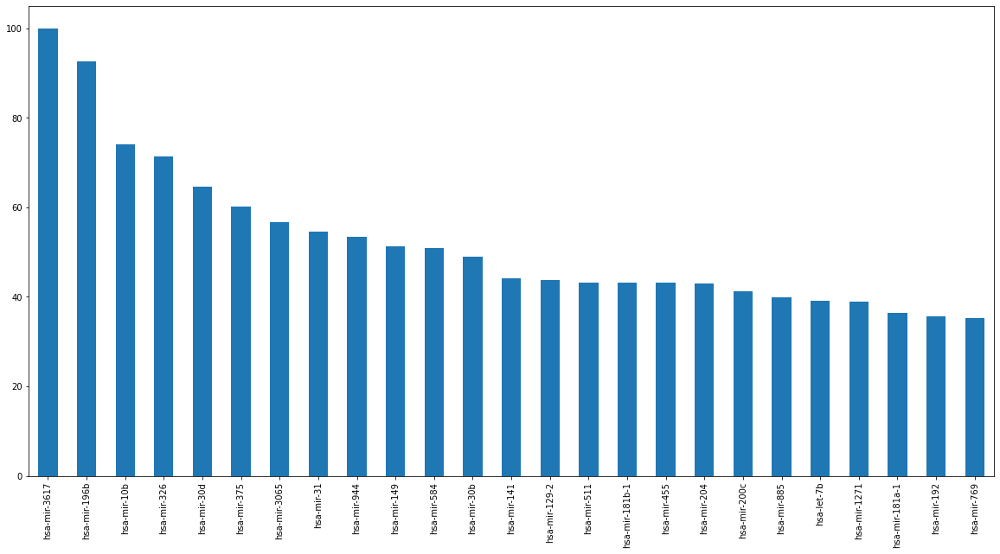

In [69]:
# 25 most important features plot
featfig = plt.figure()
featax = featfig.add_subplot(1, 1, 1)
feature_importance_data.Coeficient.plot(kind = 'bar', figsize = (20,10))



In [70]:
feature_importance_data.index

Index(['hsa-mir-3617', 'hsa-mir-196b', 'hsa-mir-10b', 'hsa-mir-326',
       'hsa-mir-30d', 'hsa-mir-375', 'hsa-mir-3065', 'hsa-mir-31',
       'hsa-mir-944', 'hsa-mir-149', 'hsa-mir-584', 'hsa-mir-30b',
       'hsa-mir-141', 'hsa-mir-129-2', 'hsa-mir-511', 'hsa-mir-181b-1',
       'hsa-mir-455', 'hsa-mir-204', 'hsa-mir-200c', 'hsa-mir-885',
       'hsa-let-7b', 'hsa-mir-1271', 'hsa-mir-181a-1', 'hsa-mir-192',
       'hsa-mir-769'],
      dtype='object')

### 4- Features Importance Analyses with LIME 

In [71]:
from lime.lime_tabular import LimeTabularExplainer

In [126]:
# get a slice of Xtrain_reduced_2  with top 25 features
X_train_top_25 = X_train_reduced_2[list(names_of_variables[top_25])]
X_test_top_25 = X_test_reduced_2[list(names_of_variables[top_25])]

In [76]:
# Training with top 25 features
model_reduced_2 = gs.fit(X_train_top_25, y_train)

In [127]:
#prediction calculations for train and test sets

y_predict_log_train_reduced = model_reduced_2.predict(X_train_top_25)
y_predict_log_test_reduced = model_reduced_2.predict(X_test_top_25)

In [83]:
#Classification report for train set

print(classification_report(y_train, y_predict_log_train_reduced))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        79
           1       0.99      1.00      0.99        73
           2       1.00      1.00      1.00        73
           3       0.99      0.99      0.99       101
           4       1.00      0.99      1.00       148
           5       0.99      0.97      0.98       158

    accuracy                           0.99       632
   macro avg       0.99      0.99      0.99       632
weighted avg       0.99      0.99      0.99       632



In [128]:
#Classification report for train set

print(classification_report(y_test, y_predict_log_test_reduced))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94        26
           1       1.00      1.00      1.00        24
           2       1.00      0.96      0.98        25
           3       0.97      1.00      0.99        34
           4       0.98      1.00      0.99        49
           5       0.98      0.98      0.98        53

    accuracy                           0.98       211
   macro avg       0.98      0.98      0.98       211
weighted avg       0.98      0.98      0.98       211



In [84]:
features_explainer = np.array(X_train_top_25)
type(X_train_top_25)

pandas.core.frame.DataFrame

In [85]:
# Instance of LimeTabularExplainer
explainer = LimeTabularExplainer(features_explainer, 
                                 mode = "classification",
                                 training_labels = y_train,
                                 feature_names = X_train_top_25.columns, 
                                 categorical_features  = [16],
                                 discretize_continuous=True, 
                                 discretizer = 'decile')

In [86]:
#Local weight of an event with primary diagnosis = Glioblastoma
i= 7
data_row = np.array(X_train_top_25.iloc[i])
explanation_1 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=25)

In [87]:
# feature inportance explanation plot 
explanation_1.show_in_notebook(show_table=True)

In [81]:
print(y_train.iloc[i])

2


In [88]:
#Local weight of an event with primary diagnosis = Squamous Cell Carcinoma
i2= 5
data_row = np.array(X_train_top_25.iloc[i2])
explanation_2 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=27)

In [89]:
# feature inportance explanation plot
explanation_2.show_in_notebook(show_table=True)

In [90]:
print(y_train.iloc[i2])

5


In [91]:
#Local weight of an event with primary diagnosis = Lung Adenocarcinoma

i3= 187
data_row = np.array(X_train_top_25.iloc[i3])
explanation_3 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=27)

In [92]:
# feature inportance explanation plot
explanation_3.show_in_notebook(show_table=True)

In [93]:
print(y_train.iloc[i3])

0


In [94]:
#Local weight of an event with primary diagnosis = Endometrium Adenocarcinoma
i4= 12
data_row = np.array(X_train_top_25.iloc[i4])
explanation_4 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=27)

In [95]:
# feature inportance explanation plot
explanation_4.show_in_notebook(show_table=True)

In [96]:
print(y_train.iloc[i4])

1


In [97]:
#Local weight of an event with primary diagnosis = Pancreatic INfiltrating Adenocarcinoma
i5= 11
data_row = np.array(X_train_top_25.iloc[i5])
explanation_5 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=27)

In [98]:
# feature inportance explanation plot
explanation_5.show_in_notebook(show_table=True)

In [99]:
print(y_train.iloc[i5])

3


In [103]:
#Local weight of an event with primary diagnosis = Renal Cell Carcinoma
i6= 371
data_row = np.array(X_train_top_25.iloc[i6])
explanation_6 = explainer.explain_instance(data_row, model_reduced.predict_proba, num_features=27)

In [104]:
# feature inportance explanation plot
explanation_6.show_in_notebook(show_table=True)

In [105]:
print(y_train.iloc[i6])

4


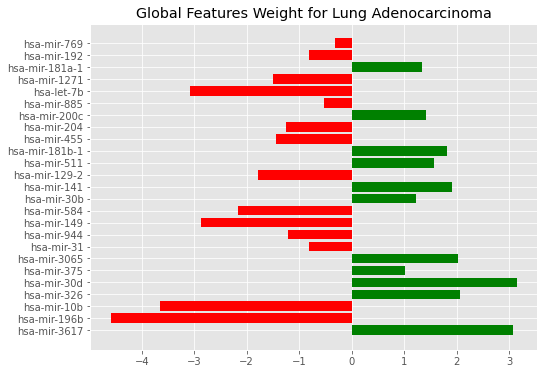

In [110]:
# Global weight for each label
# Label 0 = Lung Adenocarcinoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[0])), model_reduced_2.best_estimator_.coef_[0],\
             color=["red" if coef<0 else "green" for coef in model_reduced_2.best_estimator_.coef_[0]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[0])), X_train_top_25.columns);
    plt.title("Features Global Weight for Lung Adenocarcinoma")

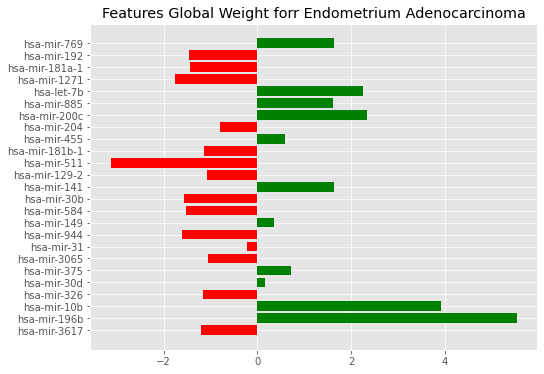

In [111]:
# Label 1 = Endometrium Adenocarcinoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[1])), model_reduced_2.best_estimator_.coef_[1], color=["red" if coef<0 else "green" for coef in model_reduced.best_estimator_.coef_[1]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[1])), X_train_top_25.columns);
    plt.title("Features Global Weight forr Endometrium Adenocarcinoma")

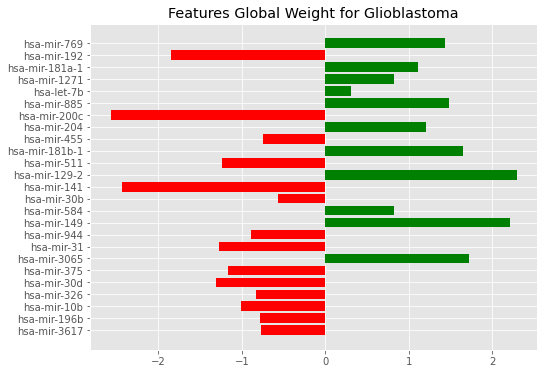

In [112]:
#Label 2 = Glioblastoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[2])), model_reduced_2.best_estimator_.coef_[2], color=["red" if coef<0 else "green" for coef in model_reduced.best_estimator_.coef_[2]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[2])), X_train_top_25.columns);
    plt.title("Features Global Weight for Glioblastoma")

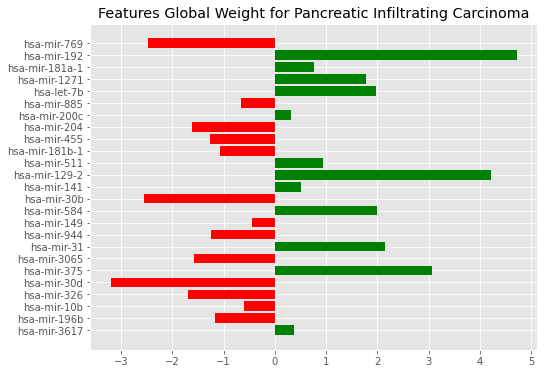

In [113]:
#Label 3 = Pancreatic Infiltrating Carcinoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[3])), model_reduced_2.best_estimator_.coef_[3], color=["red" if coef<0 else "green" for coef in model_reduced.best_estimator_.coef_[3]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[3])), X_train_top_25.columns);
    plt.title("Features Global Weight for Pancreatic Infiltrating Carcinoma")

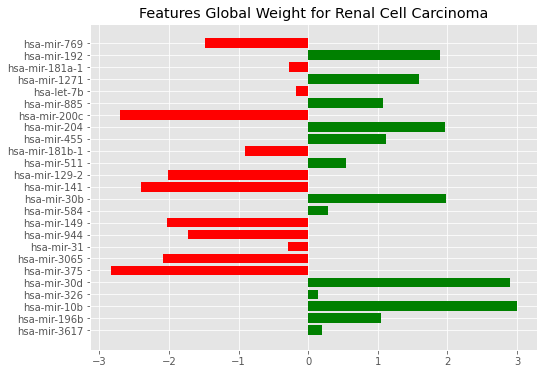

In [115]:
#Label 4 =  Renal Cell Carcinoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[4])), model_reduced_2.best_estimator_.coef_[4], color=["red" if coef<0 else "green" for coef in model_reduced.best_estimator_.coef_[4]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[4])), X_train_top_25.columns);
    plt.title("Features Global Weight for Renal Cell Carcinoma")

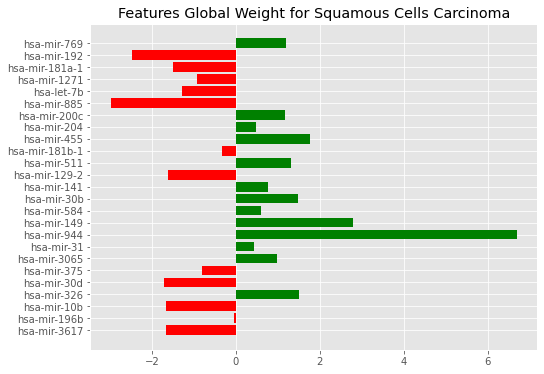

In [116]:
#Label 5 =  Squamous Cells Carcinoma
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(model_reduced_2.best_estimator_.coef_[5])), model_reduced_2.best_estimator_.coef_[5], color=["red" if coef<0 else "green" for coef in model_reduced.best_estimator_.coef_[5]])
    plt.yticks(range(len(model_reduced_2.best_estimator_.coef_[5])), X_train_top_25.columns);
    plt.title("Features Global Weight for Squamous Cells Carcinoma")

### Model 4. Regression trees based models

In [117]:
# Model performance was evaluated with the function 'evaluar_rendimiento' which return model accuracy after cross validation from
# different ensemble models
from sklearn.model_selection import cross_val_score, StratifiedKFold
cv = StratifiedKFold(n_splits=5, random_state=41, shuffle=True)

In [118]:
def evaluar_rendimiento(modelo, nombre, X, y, cv):
    s = cross_val_score(modelo, X, y, cv=cv, n_jobs=-1)
    print("Rendimiento de {}:\t{:0.3} ± {:0.3}".format( \
        nombre, s.mean().round(3), s.std().round(3)))

In [120]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=1)

evaluar_rendimiento(dt,"Árbol de decisión", X_train_reduced, y_train, cv)

Rendimiento de Árbol de decisión:	0.923 ± 0.014


In [121]:
evaluar_rendimiento(dt,"Árbol de decisión TEST", X_test_reduced, y_test, cv)

Rendimiento de Árbol de decisión TEST:	0.877 ± 0.037


In [122]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

ab = AdaBoostClassifier(base_estimator=dt, n_estimators=500,random_state=1)
evaluar_rendimiento(ab, "AdaBoostClassifier", X_train_reduced, y_train, cv)

Rendimiento de AdaBoostClassifier:	0.918 ± 0.016


In [123]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

ab = AdaBoostClassifier(base_estimator=dt, n_estimators=500,random_state=1)
evaluar_rendimiento(ab, "AdaBoostClassifier", X_test_reduced, y_test, cv)

Rendimiento de AdaBoostClassifier:	0.887 ± 0.039


In [124]:
gb = GradientBoostingClassifier()
evaluar_rendimiento(gb, "GradientBoostingClassifier",X_train_reduced, y_train, cv)

Rendimiento de GradientBoostingClassifier:	0.957 ± 0.015


In [125]:
evaluar_rendimiento(gb, "GradientBoostingClassifier TEST", X_test_reduced, y_test, cv)

Rendimiento de GradientBoostingClassifier TEST:	0.905 ± 0.056


### In conclusion, the best model was the "Logistic Regression" with 25 features with accuracy of 0.98. Besides, features global weights  for each tumor were evaluated in order to clarify miRNA expression contribution in tumor identity  